In [17]:
!pip3 install torch torchvision
!pip3 install tensorboard
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [18]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [0]:
# root is path to the project1 folder else initialize it as empty
root = 'gdrive/My Drive/CSE 676/Project 1/'

In [0]:
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch
from keras.datasets import cifar10
from keras.utils import to_categorical
import torch.nn.functional as F
from torch.optim import Adam
from torch.utils.data import Dataset
from torch.utils.tensorboard import SummaryWriter
import cv2
from PIL import Image
import os
from torchvision.transforms import Compose, ToTensor, ToPILImage, Resize
import random
from scipy.linalg import sqrtm
from torchvision.models import inception_v3
from torch.nn.utils import spectral_norm
from torchvision.utils import make_grid

# **Cifar Dataset Class and Loader**

In [0]:
def loader(dataset, batch_size, num_workers=1, shuffle=True):
    data_loader = torch.utils.data.DataLoader(dataset,
                                              batch_size,
                                              num_workers=num_workers,
                                              shuffle=shuffle)
    return data_loader
        
class Cifar10Dataset(Dataset):
    
    def __init__(self, test=False):
        super().__init__()

        if not test:
            (self.data, self.label), _ = cifar10.load_data()
        else:
            _, (self.data, self.label) = cifar10.load_data()
        
        self.transform = Compose([ToTensor()])
    
    def __getitem__(self, index):
        image = self.data[index]
        label = self.label[index]
        label = to_categorical(label, num_classes=10)
        # tranform the image to tensor note: CAN be normalized
        image = self.transform(image)
        label = self.transform(label)
        return image, label.view(-1)
    
    def __len__(self):
        return len(self.data)

    def to_pil(tensor):
        transform = Compose([ToPILImage()])
        return transform(tensor)
        

#**InceptionV3 Model**

In [0]:
class InceptionV3(nn.Module):
    def __init__(self):
        super().__init__()
        self.transform_input = False
        self.inception = inception_v3(pretrained=True, transform_input=False)
        self.inception.eval()
        
    def forward(self, x):
        batch_size = x.shape[0]
        # transform 
        x = F.interpolate(x, (299,299), mode='bilinear', align_corners=False)
        if self.transform_input:
            x_ch0 = torch.unsqueeze(x[:, 0], 1) * (0.229 / 0.5) + (0.485 - 0.5) / 0.5
            x_ch1 = torch.unsqueeze(x[:, 1], 1) * (0.224 / 0.5) + (0.456 - 0.5) / 0.5
            x_ch2 = torch.unsqueeze(x[:, 2], 1) * (0.225 / 0.5) + (0.406 - 0.5) / 0.5
            x = torch.cat((x_ch0, x_ch1, x_ch2), 1)
        # N x 3 x 299 x 299
        x = self.inception.Conv2d_1a_3x3(x)
        # N x 32 x 149 x 149
        x = self.inception.Conv2d_2a_3x3(x)
        # N x 32 x 147 x 147
        x = self.inception.Conv2d_2b_3x3(x)
        # N x 64 x 147 x 147
        x = F.max_pool2d(x, kernel_size=3, stride=2)
        # N x 64 x 73 x 73
        x = self.inception.Conv2d_3b_1x1(x)
        # N x 80 x 73 x 73
        x = self.inception.Conv2d_4a_3x3(x)
        # N x 192 x 71 x 71
        x = F.max_pool2d(x, kernel_size=3, stride=2)
        # N x 192 x 35 x 35
        x = self.inception.Mixed_5b(x)
        # N x 256 x 35 x 35
        x = self.inception.Mixed_5c(x)
        # N x 288 x 35 x 35
        x = self.inception.Mixed_5d(x)
        # N x 288 x 35 x 35
        x = self.inception.Mixed_6a(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6b(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6c(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6d(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_6e(x)
        # N x 768 x 17 x 17
        x = self.inception.Mixed_7a(x)
        # N x 1280 x 8 x 8
        x = self.inception.Mixed_7b(x)
        # N x 2048 x 8 x 8
        x = self.inception.Mixed_7c(x)
        # N x 2048 x 8 x 8
        # Adaptive average pooling
        x = F.adaptive_avg_pool2d(x, (1, 1))
        # N x 2048 x 1 x 1
        return x.view(batch_size, -1)

#**Evaluation FID Score**

In [0]:
def get_inception_model():
    model = InceptionV3()
    model.eval()
    return model

def mean_cov(tensor):
    x = tensor.detach().cpu().numpy()
    return x.mean(0), np.cov(x, rowvar=False)

def fid(model, real, fake):
    """
    How to Implement the Frechet Inception Distance (FID) for Evaluating GANs
    https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/
    """
    mu1, sigma1 = mean_cov(model_output(model, real))
    mu2, sigma2 = mean_cov(model_output(model, fake))
    ssdiff = mu1 - mu2
    covmean, _ = sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = ssdiff.dot(ssdiff) + np.trace(sigma1) + np.trace(sigma2) - 2*np.trace(covmean)
    return fid

def model_output(model, data, step=16, cpu=False):
    """
    Method to take input batch wise and provide the output
    as GPU cannot accomodate everything.
    """
    pred = []
    batch_size = data.shape[0]
    for i in range(0, batch_size, step):
        t = None
        if i+step < batch_size:
            t = model(data[i:i+step])
        else:
            t = model(data[i:])
        if cpu:
            t = t.cpu()
        pred.append(t.cpu())
    return torch.cat(pred,0)

def cmodel_output(model, data, label, step=16, cpu=False):
    """
    Method to take input batch wise and provide the output
    as GPU cannot accomodate everything.
    """
    pred = []
    batch_size = data.shape[0]
    for i in range(0, batch_size, step):
        t = None
        if i+step < batch_size:
            t = model(data[i:i+step], label[i:i+step])
        else:
            t = model(data[i:],label[i:])
        if cpu:
            t = t.cpu()
        pred.append(t.cpu())
    return torch.cat(pred,0)


def calculate_fid_score(model, real, fake, preprocess=False):
    return fid(model, real, fake)


def get_fid_score(generator, model, real_dataset, batch_size=1000, preprocess=False):
    real, labels = next(iter(loader(real_dataset, batch_size)))
    z = torch.empty(batch_size, 128, 1, 1).normal_(0, 1)
    if torch.cuda.is_available():
        z = z.cuda()
        labels = labels.cuda()
    fake = model_output(generator, z) if generator.TYPE == 'DCGAN' else cmodel_output(generator, z, labels)
    return calculate_fid_score(model, real, fake.cpu(), preprocess)


#**Custom Convolution and Self-Attention Layers**

In [0]:
class LinearBn(nn.Module):
    def __init__(self, inch, outch, norm='bn', sn=False,activation='relu'):
        super().__init__()
        self.norm = norm
        self.activation = activation
        self.linear = nn.Linear(inch, outch)
        nn.init.normal_(self.linear.weight, 0.0, 0.02)
        
        if norm == 'bn':
            self.bn = nn.BatchNorm1d(outch, eps=1e-5, momentum=0.999)
        
        if sn:
            self.linear = spectral_norm(self.linear)

        if activation == 'leaky':
            self.act = nn.LeakyReLU(negative_slope=0.2)
        elif activation == 'relu':
            self.act = nn.ReLU()
        
    def forward(self, x, out_size=None):
        h = self.linear(x)
        if self.norm == 'bn':
            h = self.bn(h)
        if self.activation:
            h = self.act(h)
        return h

class ConvBnTranspose(nn.Module):
    def __init__(self, inch, outch,kernel_size, strides=2, padding=1, output_padding=0, norm='bn', sn=False, activation='relu'):
        super().__init__()
        self.norm = norm
        self.activation = activation
        self.convT = nn.ConvTranspose2d(inch, outch, kernel_size, strides, padding,output_padding, bias=False)
        nn.init.normal_(self.convT.weight, 0.0, 0.02)
        if norm == 'bn':
            self.bn = nn.BatchNorm2d(outch, eps=1e-5, momentum=0.999)

        if sn:
            self.convT = spectral_norm(self.convT)

        if activation == 'leaky':
            self.act = nn.LeakyReLU(negative_slope=0.2)
        elif activation == 'relu':
            self.act = nn.ReLU()
        
    def forward(self, x, out_size=None):
        h = self.convT(x, out_size)
        if self.norm == 'bn':
            h = self.bn(h)
        if self.activation:
            h = self.act(h)
        return h

class ConvBn(nn.Module):
    def __init__(self, inch, outch,kernel_size, strides=2, padding=1, norm='bn', sn=False, activation='relu'):
        super().__init__()
        self.norm = norm
        self.activation = activation
        self.conv = nn.Conv2d(inch, outch, kernel_size, strides, padding)
        nn.init.normal_(self.conv.weight, 0.0, 0.02)
        if norm == 'bn':
            self.bn = nn.BatchNorm2d(outch, eps=1e-5, momentum=0.999)
        
        if sn:
            self.conv = spectral_norm(self.conv)
            
        if activation == 'leaky':
            self.act = nn.LeakyReLU(negative_slope=0.2)
        elif activation == 'relu':
            self.act = nn.ReLU()
        
    def forward(self, x):
        h = self.conv(x)
        if self.norm == 'bn':
            h = self.bn(h)
        if self.activation:
            h = self.act(h)
        return h
    
class SelfAttention(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        self.f_conv = nn.Conv2d(in_ch, in_ch//4, 1, 1, 0)
        self.g_conv = nn.Conv2d(in_ch, in_ch//4, 1, 1, 0)
        self.h_conv = nn.Conv2d(in_ch, in_ch//4, 1, 1, 0)
        self.v_conv = nn.Conv2d(in_ch//4, in_ch, 1, 1, 0)
        
        self.gamma = nn.Parameter(torch.empty(1).fill_(0.0)) # Learning parameter gamma
        
    def forward(self, x):
        batch_size, ch, h, w = x.shape
        N = w*h
        f_ = self.f_conv(x).view(batch_size, -1, N) # B x C/4 X N
        g_ = self.g_conv(x).view(batch_size, -1, N) # B x C/4 X N
        h_ = self.h_conv(x).view(batch_size, -1, N) # B x C/4 X N
        attn_map = torch.matmul(torch.transpose(f_, 1, 2), g_) # B x N X N
        attn_map = attn_map.softmax(2) # B x N X N
        o = torch.matmul(h_, torch.transpose(attn_map, 1, 2)) # B x C/4 X N
        o = o.view(batch_size, -1, h, w) # B x C/4 X H x W
        o = self.v_conv(o) # B x C X H x W
        return self.gamma*o + x, attn_map

class Identity(nn.Module):
    def forward(self, x):
        return x

#**Generator Model**

In [0]:
class Generator(nn.Module):

    def __init__(self, in_ch):
        super().__init__()
        self.TYPE = 'DCGAN'
        self.in_ch = in_ch
        ngf = 64
        self.conv1 = ConvBnTranspose(in_ch, ngf*8, 4, 1, 0, 0)
        self.conv2 = ConvBnTranspose(ngf*8, ngf*4, 4, 2, 1, 0)
        self.conv3 = ConvBnTranspose(ngf*4, ngf*2, 4, 2, 1, 0)
        self.conv4 = ConvBnTranspose(ngf*2, 3, 4, 2, 1, 0, norm=None, activation=None)
        self.tanh = nn.Tanh()
    
    def forward(self, x):
        batch_size = x.shape[0]
        # N x 128 X 1 x 1
        h = self.conv1(x)
        # N x 1024 x 4 x 4
        h = self.conv2(h)
        # N x 512 x 8 x 8
        h = self.conv3(h)
        # N x 256 x 16 x 16
        h = self.conv4(h)
        # N x 3 x 32 x 32
        return self.tanh(h)

    def input_channel(self):
        return self.in_ch    

#**Discriminator Model**

In [0]:
class Discriminator(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        ndf = 64
        self.conv1 = ConvBn(in_ch, ndf, 4, 2, 1, norm=None, activation='leaky') 
        self.conv2 = ConvBn(ndf, ndf*2, 4, 2, 1, activation='leaky')
        self.conv3 = ConvBn(ndf*2, ndf*4, 4, 2, 1, activation='leaky')
        self.conv4 = ConvBn(ndf*4, 1, 4, 1, 0, norm=None, activation=None)
    
    def forward(self, x):
        batch_size = x.shape[0]
        # N x 3 x 32 x 32
        h = self.conv1(x)
        # N x 64 x 16 x 16
        h = self.conv2(h)
        # N x 128 x 8 x 8
        h = self.conv3(h)
        # N x 256 x 4 x 4
        h = self.conv4(h)
        # N x 1 x 1 x 1
        return torch.sigmoid(h)

#**Self-Attention Generator**

In [0]:
class SelfAttnGenerator(nn.Module):

    def __init__(self, in_ch):
        super().__init__()
        self.in_ch = in_ch
        self.TYPE = 'SAGAN'
        ngf = 64
        self.conv1 = ConvBnTranspose(in_ch, ngf*8, 4, 1, 0, 0, sn=True)
        self.conv2 = ConvBnTranspose(ngf*8, ngf*4, 4, 2, 1, 0, sn=True)
        self.conv3 = ConvBnTranspose(ngf*4, ngf*2, 4, 2, 1, 0, sn=True)
        self.conv4 = ConvBnTranspose(ngf*2, ngf, 4, 2, 1, 0, sn=True)
        self.attn = SelfAttention(ngf)
        self.conv5 = ConvBnTranspose(ngf, 3, 3, 1, 1, 0, norm=None, activation=None)
        self.tanh = nn.Tanh()
    
    def forward(self, x, label):
        batch_size = x.shape[0]
        if len(label.shape) != 4:
            label = label.view(batch_size, -1, 1, 1)  
        # N x 128 x 1 x 1
        x = torch.cat([x,label], 1)
        # N x 138 x 1 x 1
        h = self.conv1(x)
        # N x 512 x 4 x 4
        h = self.conv2(h)
        # N x 256 x 8 x 8
        h = self.conv3(h)
        # N x 128 x 16 x 16
        h = self.conv4(h)
        # N x 64 x 32 x 32
        h, _ = self.attn(h)
        # N x 64 x 32 x 32
        h = self.conv5(h)
        # N x 3 x 32 x 32
        return self.tanh(h)

    def visualize(self, x, label):
        batch_size = x.shape[0]
        if len(label.shape) != 4:
            label = label.view(batch_size, -1, 1, 1)  
        # N x 128 x 1 x 1
        x = torch.cat([x,label], 1)
        # N x 138 x 1 x 1
        h = self.conv1(x)
        # N x 512 x 4 x 4
        h = self.conv2(h)
        # N x 256 x 8 x 8
        h = self.conv3(h)
        # N x 128 x 16 x 16
        h = self.conv4(h)
        # N x 64 x 32 x 32
        h, attn_map = self.attn(h)
        # N x 64 x 32 x 32
        h = self.conv5(h)
        # N x 3 x 32 x 32
        return self.tanh(h), attn_map

    def input_channel(self):
        return self.in_ch    

#**Wasserstein Critic**

In [0]:
def compute_gradient_penalty_loss(dis, real_sample, fake_sample, labels, lambda_gp):
    """
    Calculating WGAN-GP
    Improved Training of Wasserstein GANs
    Algorithm:
    https://arxiv.org/pdf/1704.00028.pdf
    https://github.com/eriklindernoren/PyTorch-GAN/blob/master/implementations/wgan_gp/wgan_gp.py
    """
    epsilon = torch.empty(real_sample.size(0),1,1,1).uniform_(0, 1)
    fake = torch.empty((real_sample.size(0), 1, 1, 1)).fill_(1.0)
    if torch.cuda.is_available():
        epsilon = epsilon.cuda()
        fake = fake.cuda()
    # epsilon = torch.Tensor(np.random.random((real.size(0), 1, 1, 1)))
    x_hat = (epsilon * real_sample + ((1 - epsilon) * fake_sample)).requires_grad_(True)
    d_loss = dis(x_hat, labels)

    gradients = torch.autograd.grad(
        outputs=d_loss,
        inputs=x_hat,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return lambda_gp * gradient_penalty

class WGANDiscriminator(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        ndf = 64
        self.conv1 = ConvBn(in_ch, ndf, 3, 1, 1, norm=None, sn=True, activation='leaky')
        self.attn = SelfAttention(ndf)
        self.conv2 = ConvBn(ndf, ndf*2, 4, 2, 1, norm=None, sn=True, activation='leaky')
        self.conv3 = ConvBn(ndf*2, ndf*4, 4, 2, 1, norm=None, sn=True, activation='leaky')
        self.conv4 = ConvBn(ndf*4, ndf*8, 4, 2, 1, norm=None, sn=True, activation='leaky')
        self.conv5 = ConvBn(ndf*8, 1, 4, 1, 0, norm=None, activation=None)
    
    def forward(self, x, label):
        batch_size, _, h, w = x.shape
        label = self.channel_embedding(label, x.shape) # per-pixel labelling
        # N x 3 x 32 x 32
        x = torch.cat([x,label],1)
        # N x 13 x 32 x 32
        h = self.conv1(x)
        # N x 64 x 32 x 32
        h, _ = self.attn(h)
        # N x 64 x 32 x 32
        h = self.conv2(h)
        # N x 128 x 16 x 16
        h = self.conv3(h)
        # N x 256 x 8 x 8
        h = self.conv4(h)
        # N x 512 x 4 x 4
        h = self.conv5(h)
        # N x 1 x 1 x 1
        return h

    def channel_embedding(self, tensor, shape):
        batch_size, _, h, w = shape
        tensor = tensor.view(batch_size, -1,  1, 1)
        tensor = tensor.repeat_interleave(h, dim=2)
        tensor = tensor.repeat_interleave(w, dim=3)
        return tensor

In [0]:
def save_images(images, epoch, iteration, prefix):
    images = images.cpu()
    batch = images.shape[0]
    for i in range(batch):
        im = Cifar10Dataset.to_pil(images[i])
        im.save("{}outputs/image_{}_{}_{}_{}.png".format(root,prefix, i, epoch,iteration))
    print("Images saved!!")
    
def sample_noise(size):
    z = torch.empty(size).normal_(0,1)
    if torch.cuda.is_available():
        z = z.cuda()
    return z

#**Training DC-GAN**

In [0]:
def train(gen, dis, dataset, batch_size, epochs, iterations, backup=None, val_dataset=None, log_suffix=''):
    if torch.cuda.is_available():
        gen = gen.cuda()
        dis = dis.cuda()
    
    optimizerG = Adam(gen.parameters(),lr=2e-4)
    optimizerD = Adam(dis.parameters(),lr=2e-4)
    e_start = 0
    if backup:        
        if os.path.exists(backup[0]):
            checkpointG = torch.load(backup[0])
            gen.load_state_dict(checkpointG['model_state_dict'])
            optimizerG.load_state_dict(checkpointG['optimizer_state_dict'])
            e_start = checkpointG['epoch'] + 1
            print('Generator ReLoaded!!')

        if os.path.exists(backup[1]):
            checkpointD = torch.load(backup[1])
            dis.load_state_dict(checkpointD['model_state_dict'])
            optimizerD.load_state_dict(checkpointD['optimizer_state_dict'])
            print('Discriminator ReLoaded!!')
        if e_start != 0:
            print("Resuming training from epoch: {}".format(e_start))

    data_loader = loader(dataset, batch_size)
    data_iter = iter(data_loader)
    data, labels = None, None
    
    gen.train()
    dis.train()

    inceptionv3 = get_inception_model()
    criterion = nn.BCELoss()
    r = torch.randn(3, 128, 1, 1).normal_(0,1)
    
    if torch.cuda.is_available():
        r = r.cuda()
        criterion = criterion.cuda()
    
    summary = SummaryWriter(root+'logs/'+log_suffix, purge_step=e_start*iterations)
    
    for e in range(e_start, epochs):
        for i in range(iterations):
            # Code for training here
            try:
                data, _ = next(data_iter)
            except StopIteration:
                data_iter = iter(data_loader)
                data, _ = next(data_iter)
            
            batch_size = data.shape[0]

            fake = torch.empty(batch_size, 1, 1, 1).fill_(0.0)
            real = torch.empty(batch_size, 1, 1, 1).fill_(1.0)
            
            # Train Discriminator
            z = torch.empty(batch_size, 128, 1, 1).normal_(0,1)
            
            if torch.cuda.is_available():
                fake = fake.cuda()
                real = real.cuda()
                z = z.cuda()
                data = data.cuda()

            dis.zero_grad()
            loss_real = criterion(dis(data), real)
            loss_real.backward()

            fake_img = gen(z)
            fake_img = fake_img.detach()
            loss_fake = criterion(dis(fake_img), fake)
            loss_fake.backward()
            lossD = loss_fake + loss_real
            optimizerD.step()
            
            gen.zero_grad()
            
            #Train Generator
            pred = gen(z)
            lossG = criterion(dis(pred), real)
            lossG.backward()
            optimizerG.step()

            print("epochs: {}/{} | iterations: {}/{} | Fake Loss: {} | Real Loss: {} | DCGAN Loss: {}".format(
                e, epochs, i, iterations, loss_fake, loss_real, lossG))
            itr = e*iterations + i
            summary.add_scalar('Discriminator Loss', lossD, itr)
            summary.add_scalar('GAN Loss', lossG, itr)
            if val_dataset and itr%1000 == 0:
                summary.add_scalar('FID Score', get_fid_score(gen, inceptionv3, val_dataset, 128), itr)
            
        gen.eval()
        pred = gen(r)
        save_images(pred,e,i,'dc')
        gen.train()
        
        if backup:
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': gen.state_dict(),
                    'optimizer_state_dict': optimizerG.state_dict()
                }
                , backup[0]
            )
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': dis.state_dict(),
                    'optimizer_state_dict': optimizerD.state_dict()
                }
                , backup[1]
            )

#**Training W-GAN with gradient penalty**

In [0]:
def train_wgan(gen, dis, dataset, batch_size, epochs, iterations, backup=None, val_dataset=None, log_suffix=''):
    N_CRITIC_ITER = 5
    if torch.cuda.is_available():
        gen = gen.cuda()
        dis = dis.cuda()
    
    optimizerG = Adam(gen.parameters(),lr=1e-4, betas=(0.0, 0.9))
    optimizerD = Adam(dis.parameters(),lr=1e-4, betas=(0.0, 0.9))
    e_start = 0
    if backup:        
        if os.path.exists(backup[0]):
            checkpointG = torch.load(backup[0])
            gen.load_state_dict(checkpointG['model_state_dict'])
            optimizerG.load_state_dict(checkpointG['optimizer_state_dict'])
            e_start = checkpointG['epoch'] + 1
            print('Generator ReLoaded!!')

        if os.path.exists(backup[1]):
            checkpointD = torch.load(backup[1])
            dis.load_state_dict(checkpointD['model_state_dict'])
            optimizerD.load_state_dict(checkpointD['optimizer_state_dict'])
            print('Discriminator ReLoaded!!')
        if e_start != 0:
            print("Resuming training from epoch: {}".format(e_start))

    data_loader = loader(dataset, batch_size)
    data_iter = iter(data_loader)
    data, label = None, None
    
    gen.train()
    dis.train()

    inceptionv3 = get_inception_model()
    
    r = torch.randn(10, 128, 1, 1).normal_(0,1)
    l = torch.tensor(to_categorical(np.arange(0,10).reshape(10,1),10))
    one = torch.tensor(1.0)
    mone = -1 * one
    if torch.cuda.is_available():
        r = r.cuda()
        l = l.cuda()
        one = one.cuda()
        mone = mone.cuda()
    summary = SummaryWriter(root+'logs/'+log_suffix, purge_step=e_start*iterations)
    
    for e in range(e_start, epochs):
        for i in range(iterations):
            # Code for training here
            try:
                data, label = next(data_iter)
            except StopIteration:
                data_iter = iter(data_loader)
                data, label = next(data_iter)
            
            batch_size = data.shape[0]
         
            # Train Discriminator
            if torch.cuda.is_available():
                data = data.cuda()
                label = label.cuda()
                
            for p in dis.parameters():
                p.require_grad = True

            wgan_loss, loss_dis = 0, 0
            for _ in range(N_CRITIC_ITER):
                z = sample_noise((batch_size, 128, 1, 1))
                dis.zero_grad()
                real_loss = dis(data,label).mean()
                real_loss.backward(mone)

                fake_img = gen(z, label)
                fake_img = fake_img.detach()
                fake_loss = dis(fake_img, label).mean()
                fake_loss.backward(one)

                gradient_penalty = compute_gradient_penalty_loss(dis, data, fake_img, label,  10)
                gradient_penalty.backward()
                loss_dis = fake_loss - real_loss + gradient_penalty
                wgan_loss = real_loss - fake_loss
                optimizerD.step()
            

            for p in dis.parameters():
                p.require_grad = False

            gen.zero_grad()
            
            #Train Generator
            z = sample_noise((batch_size, 128, 1, 1))
            pred = gen(z,label)
            lossG = dis(pred, label).mean()
            lossG.backward(mone)
            loss_gen = -lossG
            optimizerG.step()

            print("epochs: {}/{} | iterations: {}/{} | Discriminator Loss: {} | DCGAN Loss: {}".format(
                e, epochs, i, iterations, loss_dis, loss_gen))
            itr = e*iterations + i
            summary.add_scalar('Discriminator Loss', loss_dis, itr)
            summary.add_scalar('GAN Loss', loss_gen, itr)
            summary.add_scalar('Wasserstein Loss', wgan_loss, itr)
            if val_dataset and itr%1000 == 0:
                summary.add_scalar('FID Score', get_fid_score(gen, inceptionv3, val_dataset, 128), itr)
            
        gen.eval()
        pred = gen(r, l)
        save_images(pred,e,i,'sa')
        gen.train()
        
        if backup:
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': gen.state_dict(),
                    'optimizer_state_dict': optimizerG.state_dict()
                }
                , backup[0]
            )
            torch.save(
                {
                    'epoch': e,
                    'model_state_dict': dis.state_dict(),
                    'optimizer_state_dict': optimizerD.state_dict()
                }
                , backup[1]
            )

#**Tensorboard Results**

In [33]:
# use logs/ folder provided in the submission.
%tensorboard --logdir gdrive/My\ Drive/CSE\ 676/Project\ 1/logs/

Reusing TensorBoard on port 6006 (pid 4036), started 0:00:05 ago. (Use '!kill 4036' to kill it.)

In [0]:
batch_size = 64
dataset = Cifar10Dataset()
val_dataset = Cifar10Dataset(test=True)

In [0]:
dcgan_gen = Generator(128)
dcgan_dis = Discriminator(3)
backup = (root+'models/dcgan_generator.pt',root+'models/dcgan_discriminator.pt')
train(dcgan_gen, dcgan_dis, dataset, batch_size, 150, 800, backup, val_dataset, 'dcgan')

Generator ReLoaded!!
Discriminator ReLoaded!!
Resuming training from epoch: 120


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth
100%|██████████| 104M/104M [00:01<00:00, 94.1MB/s] 


epochs: 120/150 | iterations: 0/800 | Fake Loss: 0.3519265353679657 | Real Loss: 0.01298485603183508 | DCGAN Loss: 3.455230712890625
epochs: 120/150 | iterations: 1/800 | Fake Loss: 0.08519940078258514 | Real Loss: 0.02602471224963665 | DCGAN Loss: 5.279000282287598
epochs: 120/150 | iterations: 2/800 | Fake Loss: 0.19294719398021698 | Real Loss: 0.11899107694625854 | DCGAN Loss: 4.011681079864502
epochs: 120/150 | iterations: 3/800 | Fake Loss: 0.05215344578027725 | Real Loss: 0.5602675080299377 | DCGAN Loss: 3.8746073246002197
epochs: 120/150 | iterations: 4/800 | Fake Loss: 0.029148217290639877 | Real Loss: 0.06021007522940636 | DCGAN Loss: 4.1314377784729
epochs: 120/150 | iterations: 5/800 | Fake Loss: 0.0573379211127758 | Real Loss: 0.06911813467741013 | DCGAN Loss: 3.351290464401245
epochs: 120/150 | iterations: 6/800 | Fake Loss: 0.12055173516273499 | Real Loss: 0.040749359875917435 | DCGAN Loss: 3.2271857261657715
epochs: 120/150 | iterations: 7/800 | Fake Loss: 0.163590952754

In [0]:
sagan_gen = SelfAttnGenerator(128+10)
sagan_dis = WGANDiscriminator(13)
backupsa = (root+'models/sagan_generator.pt',root+'models/sagan_discriminator.pt')
train_wgan(sagan_gen, sagan_dis, dataset, batch_size, 40, 800, backupsa, val_dataset, 'sagan')

Generator ReLoaded!!
Discriminator ReLoaded!!
Resuming training from epoch: 14


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth
100%|██████████| 104M/104M [00:01<00:00, 94.1MB/s] 


epochs: 14/40 | iterations: 0/800 | Discriminator Loss: -0.794155478477478 | DCGAN Loss: -44.9388427734375
epochs: 14/40 | iterations: 1/800 | Discriminator Loss: -2.0530292987823486 | DCGAN Loss: -37.58290100097656
epochs: 14/40 | iterations: 2/800 | Discriminator Loss: -0.9736839532852173 | DCGAN Loss: -47.81098937988281
epochs: 14/40 | iterations: 3/800 | Discriminator Loss: -1.239057183265686 | DCGAN Loss: -55.6883659362793
epochs: 14/40 | iterations: 4/800 | Discriminator Loss: -2.0258593559265137 | DCGAN Loss: -50.56435775756836
epochs: 14/40 | iterations: 5/800 | Discriminator Loss: -0.7341168522834778 | DCGAN Loss: -48.643585205078125
epochs: 14/40 | iterations: 6/800 | Discriminator Loss: -0.8735775351524353 | DCGAN Loss: -37.71439743041992
epochs: 14/40 | iterations: 7/800 | Discriminator Loss: -0.19803231954574585 | DCGAN Loss: -41.245975494384766
epochs: 14/40 | iterations: 8/800 | Discriminator Loss: -1.657355785369873 | DCGAN Loss: -36.62824249267578
epochs: 14/40 | itera

#**Image Grid Display**

In [0]:
def load_gen(gen, path, train=False):
    if torch.cuda.is_available():
        gen = gen.cuda()
    if os.path.exists(path):
        checkpointG = torch.load(path, torch.device('cpu'))
        gen.load_state_dict(checkpointG['model_state_dict'])
        # optimizerG.load_state_dict(checkpointG['optimizer_state_dict'])
        print('Generator Loaded!!')
        if train:
            gen.train()
        else:
            gen.eval()
        return gen
    print("{} does not exist!".format(path))

def show(images):
    images = images.cpu()
    f, axarr = plt.subplots(8, 8, figsize=(15,15))
    for i in range(8):
        for j in range(8):
            axarr[i][j].imshow(Cifar10Dataset.to_pil(images[i*8+j]))

#**DCGAN Results**

In [36]:
g = load_gen(Generator(128), root+'models/dcgan_generator.pt')

Generator Loaded!!


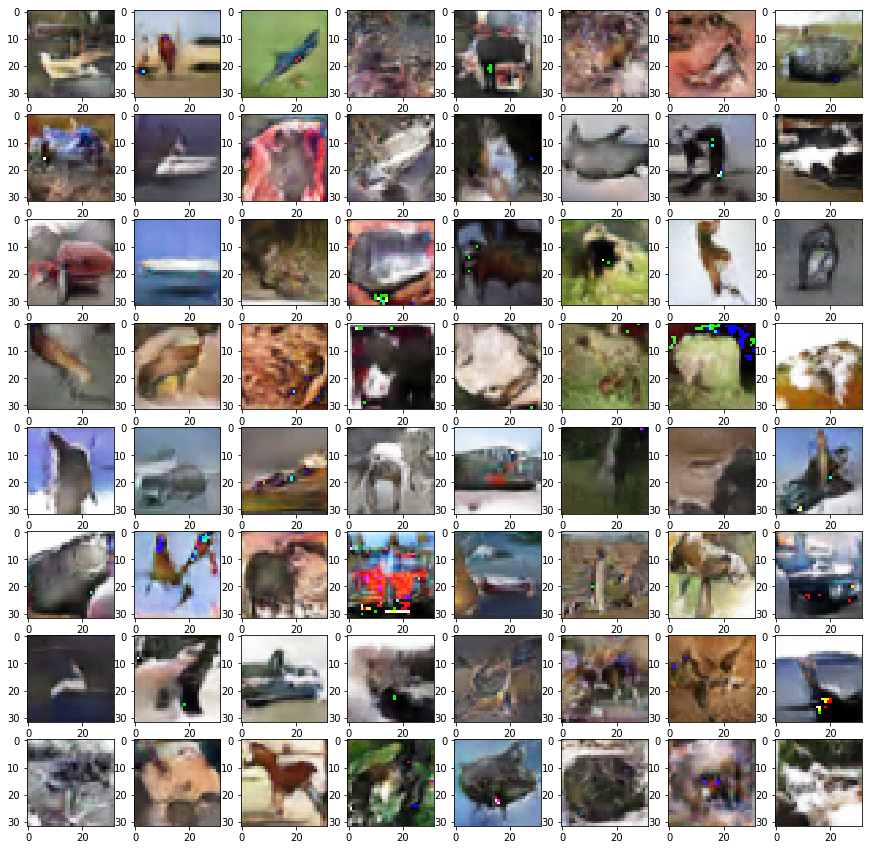

In [40]:
batch_size = 64
z = torch.empty(batch_size, 128, 1, 1).normal_(0,1)
if torch.cuda.is_available():
    z = z.cuda()
pred = g(z)
show(pred)

#**SAGAN Results**

In [41]:
g_sa = load_gen(SelfAttnGenerator(138), root+'models/sagan_generator.pt')

Generator Loaded!!


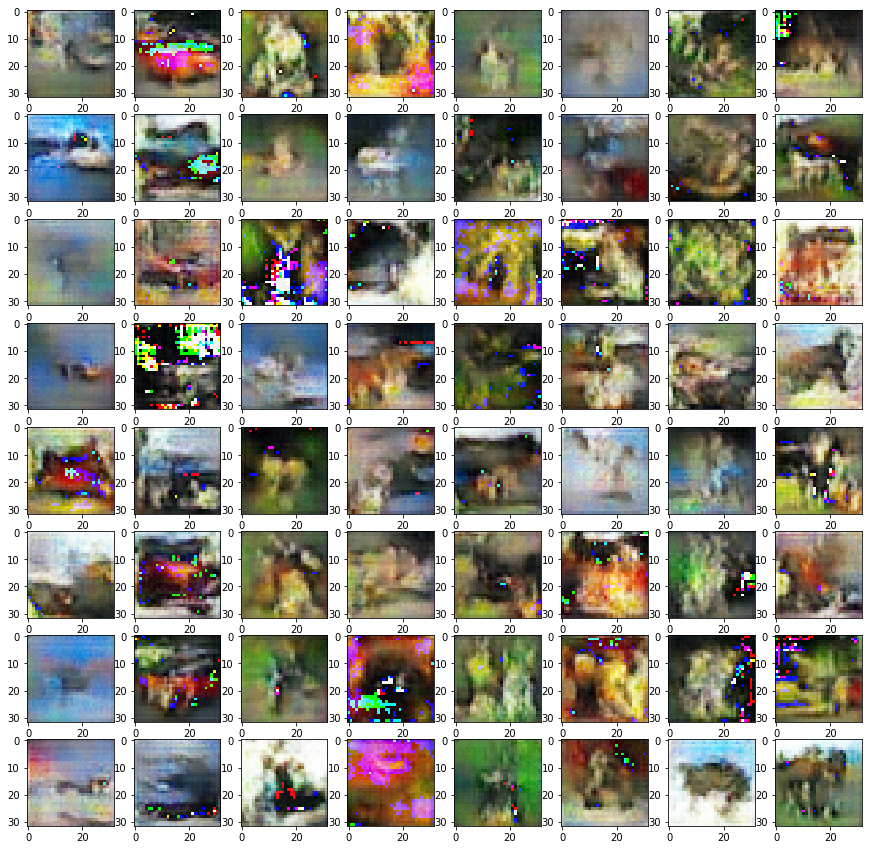

In [42]:
batch_size = 64
z = torch.empty(batch_size, 128, 1, 1).normal_(0,1)
l = torch.tensor(to_categorical(np.array([i%8 for i in range(64)]).reshape(64,1),10))
if torch.cuda.is_available():
    z = z.cuda()
    l = l.cuda()
pred = g_sa(z, l)
show(pred)

#**Visualizing Attention Map**

In [0]:
def visualize_map(g, class_=5):
    a = torch.empty(1,128,1,1).normal_(0,1).cuda()
    b = torch.tensor(to_categorical(np.array([class_]), 10)).view(1,10).type(torch.FloatTensor).cuda()
    image, attn = g.visualize(a,b)
    attn = attn.squeeze(0)
    plt.imshow(Cifar10Dataset.to_pil(image[0].cpu()))
    fig, axrr = plt.subplots(32,32, figsize=(20,20))
    for i in range(32):
        for j in range(32):
            index = i*32 + j
            a = attn[index,:]
            axrr[i][j].imshow(Cifar10Dataset.to_pil(a.view(32,32).cpu() * 255), cmap='gray')

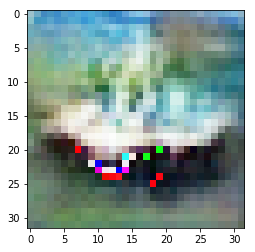

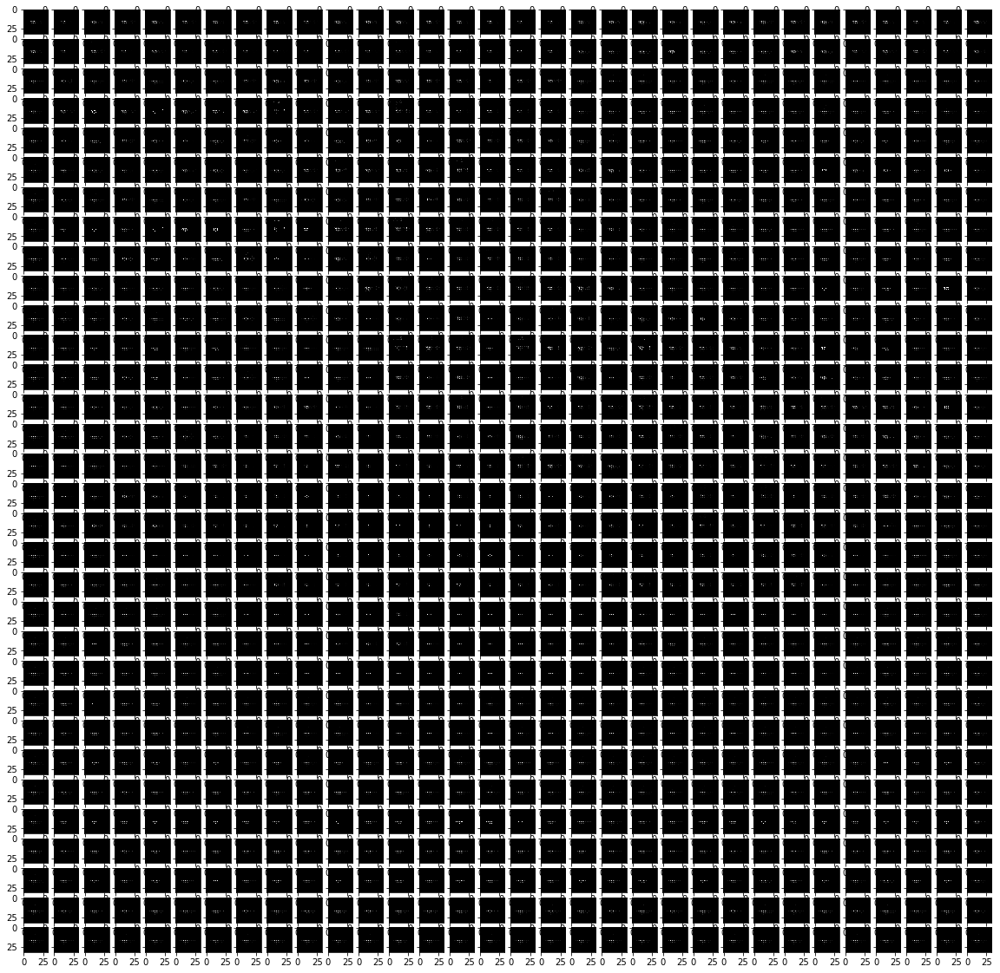

In [78]:
visualize_map(g_sa,9)

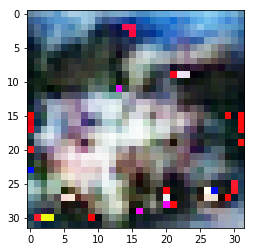

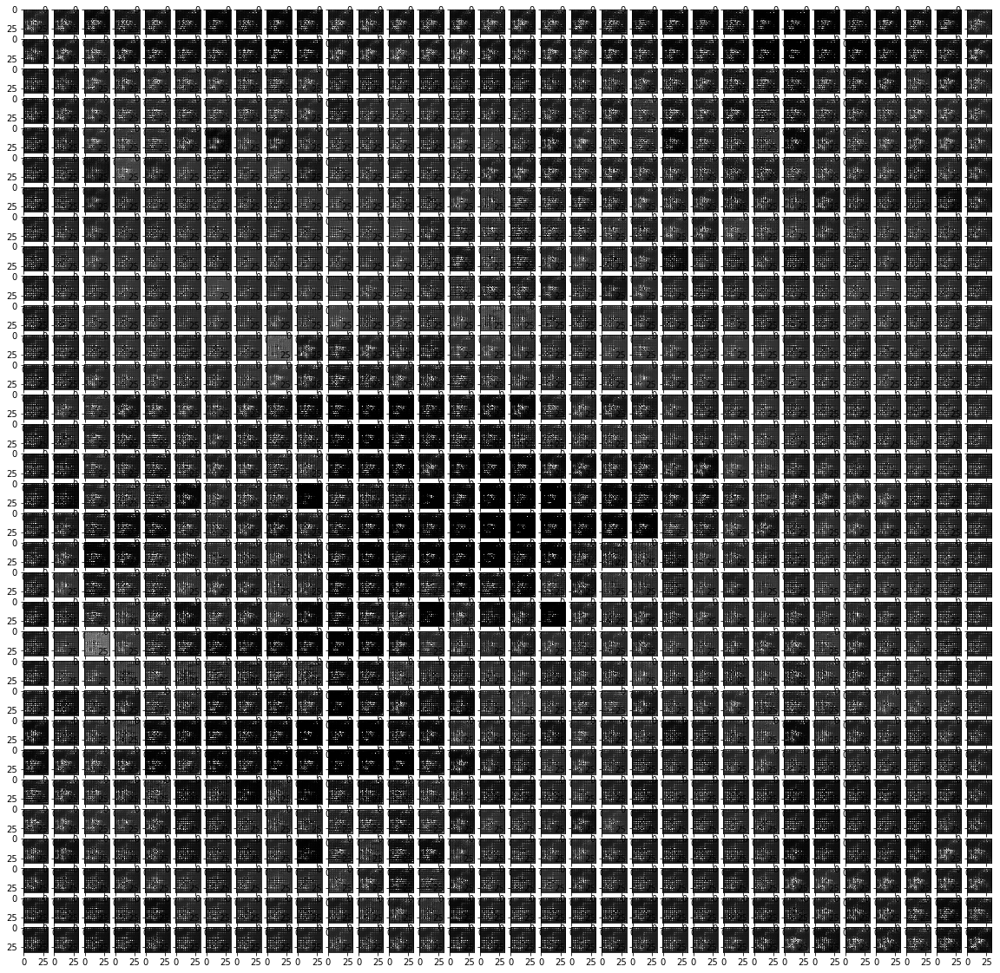

In [85]:
visualize_map(g_sa,9)